In [1]:
import os, sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import zipfile
import shutil
from pathlib import Path

In [2]:
import warnings
warnings.filterwarnings('ignore')

### Loading packages

In [3]:
import sys
from pathlib import Path

here_path = Path().resolve()
repo_path = here_path.parents[1]
sys.path.append(str(repo_path))

In [4]:
from py.utils import verifyDir, verifyFile

In [5]:
from py.config import Config

cfg = Config()

np.random.seed(cfg.RANDOM_STATE)
cfg.DATA_PATH, cfg.MODEL_PATH

('/media/felipe/DATA19/datasets/', '/media/felipe/DATA19/models/')

In [6]:
QSCORE_PATH=f"{cfg.DATA_PATH}pp2/Qscores/"
IMAGES_PATH = f"{cfg.DATA_PATH}pp2/images/"

### Loading data

In [7]:
%%time
data_df = pd.read_csv(f"{QSCORE_PATH}scores.csv", sep=";", low_memory=False)
data_df["image_path"] = f"{IMAGES_PATH}" + data_df["image_path"]
if "CITY_STUDIED" in Config.model_fields:
    data_df = data_df[data_df["city"]==cfg.CITY_STUDIED].copy()
data_df["image_id"] = data_df["image_id"].apply(str)
data_df.sort_values(by=cfg.PERCEPTION_METRIC, inplace=True, ascending=False)

CPU times: user 154 ms, sys: 25.9 ms, total: 180 ms
Wall time: 180 ms


### City Studied

In [8]:
import glob

In [9]:
TOP_K = 25

#### High scores

In [10]:
top_k_images_path = data_df.iloc[:TOP_K]["image_path"].values

1 50f5eaecfdc9f065f0007e32 8.07411071970459
2 50f5eb4bfdc9f065f00081e0 7.99080549080549
3 50f5eb65fdc9f065f000826f 7.920454545454545
4 50f5eb44fdc9f065f0008149 7.845117845117845
5 50f5eaa3fdc9f065f0007b62 7.784126984126984
6 50f5ebaafdc9f065f0008430 7.758610541505279
7 50f5ebcffdc9f065f00085b8 7.692307692307692
8 50f5ec0cfdc9f065f000863e 7.514245014245015
9 50f5eb69fdc9f065f00082c6 7.4684343434343425
10 50f5eb44fdc9f065f0008156 7.446637426900586
11 50f5eb1ffdc9f065f0007fe8 7.430555555555557
12 50f5eb1dfdc9f065f0007fc2 7.430555555555555
13 50f5ec39fdc9f065f0008834 7.424242424242426
14 50f5eaa4fdc9f065f0007b6a 7.420634920634921
15 50f5eb48fdc9f065f000819e 7.380952380952381
16 50f5ec40fdc9f065f00088b1 7.373543123543124
17 50f5eba4fdc9f065f00083ca 7.333333333333334
18 50f5ead5fdc9f065f0007dc2 7.332713582713583
19 50f5ebd5fdc9f065f0008636 7.263814616755794
20 50f5eb17fdc9f065f0007f57 7.228375669165143
21 50f5ec32fdc9f065f00087aa 7.222222222222222
22 50f5ec42fdc9f065f00088eb 7.22222222222222

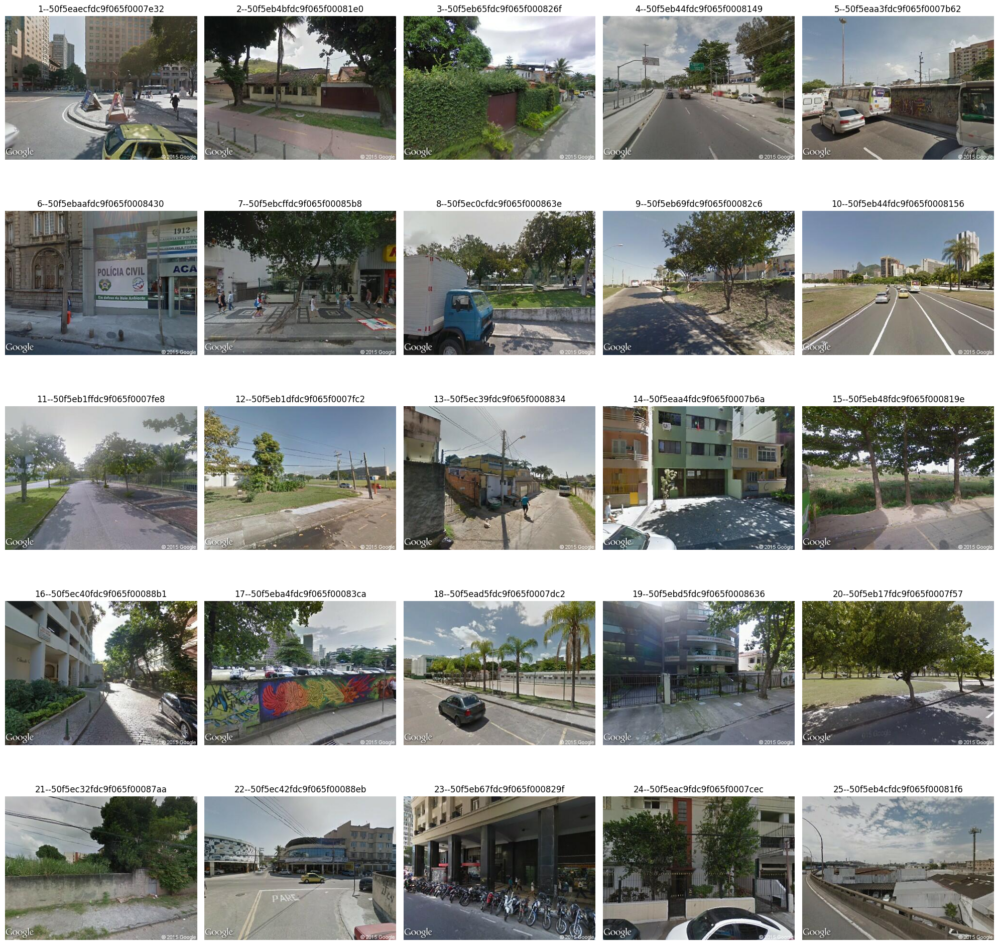

In [11]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Number of images
num_images = len(top_k_images_path)

# Create a figure with a 4x4 grid (adjust figsize as needed)
fig, axes = plt.subplots(5, 5, figsize=(20, 20))

# Flatten the axes for easy iteration
axes = axes.ravel()

# Iterate over the images and plot them
for i in range(num_images):
    title = top_k_images_path[i].split("/")[-1].replace(".JPG", "")
    score = data_df[data_df["image_id"]==title][cfg.PERCEPTION_METRIC].values[0]
    print(i+1, title, score)
    img = mpimg.imread(top_k_images_path[i])  # Load the image
    axes[i].imshow(img)  # Show the image
    axes[i].set_title(f"{i+1}--{title}")
    axes[i].axis('off')  # Turn off the axis

# Adjust layout and display the grid of images
plt.tight_layout()
plt.show()

#### Low scores

In [12]:
bot_k_images_path = data_df.iloc[-TOP_K:]["image_path"].values

1 50f5ec10fdc9f065f0008688 1.3333333333333337
2 50f5eaf1fdc9f065f0007e8b 1.3333333333333337
3 50f5ec38fdc9f065f0008813 1.322751322751323
4 50f5eac9fdc9f065f0007ce5 1.3203463203463204
5 50f5ebcffdc9f065f00085ac 1.282051282051282
6 50f5eae9fdc9f065f0007ded 1.25
7 50f5eb67fdc9f065f0008299 1.2121212121212122
8 50f5ec3bfdc9f065f0008850 1.2121212121212122
9 50f5eb6cfdc9f065f00082ff 1.188811188811189
10 50f5ec42fdc9f065f00088de 1.1764705882352942
11 50f5eb61fdc9f065f0008222 1.1764705882352942
12 50f5ead4fdc9f065f0007dac 1.1111111111111114
13 50f5eb1cfdc9f065f0007fbb 1.1111111111111114
14 50f5eb49fdc9f065f00081b6 1.1111111111111114
15 50f5eba1fdc9f065f0008391 1.0526315789473684
16 50f5ebc6fdc9f065f00084f7 1.0000000000000002
17 50f5eba2fdc9f065f00083a5 1.0000000000000002
18 50f5eaa8fdc9f065f0007bb4 0.9986504723346828
19 50f5eaf2fdc9f065f0007eab 0.9523809523809524
20 50f5ec14fdc9f065f00086db 0.9090909090909092
21 50f5ebcefdc9f065f0008595 0.8333333333333334
22 50f5eb26fdc9f065f0008065 0.833333333

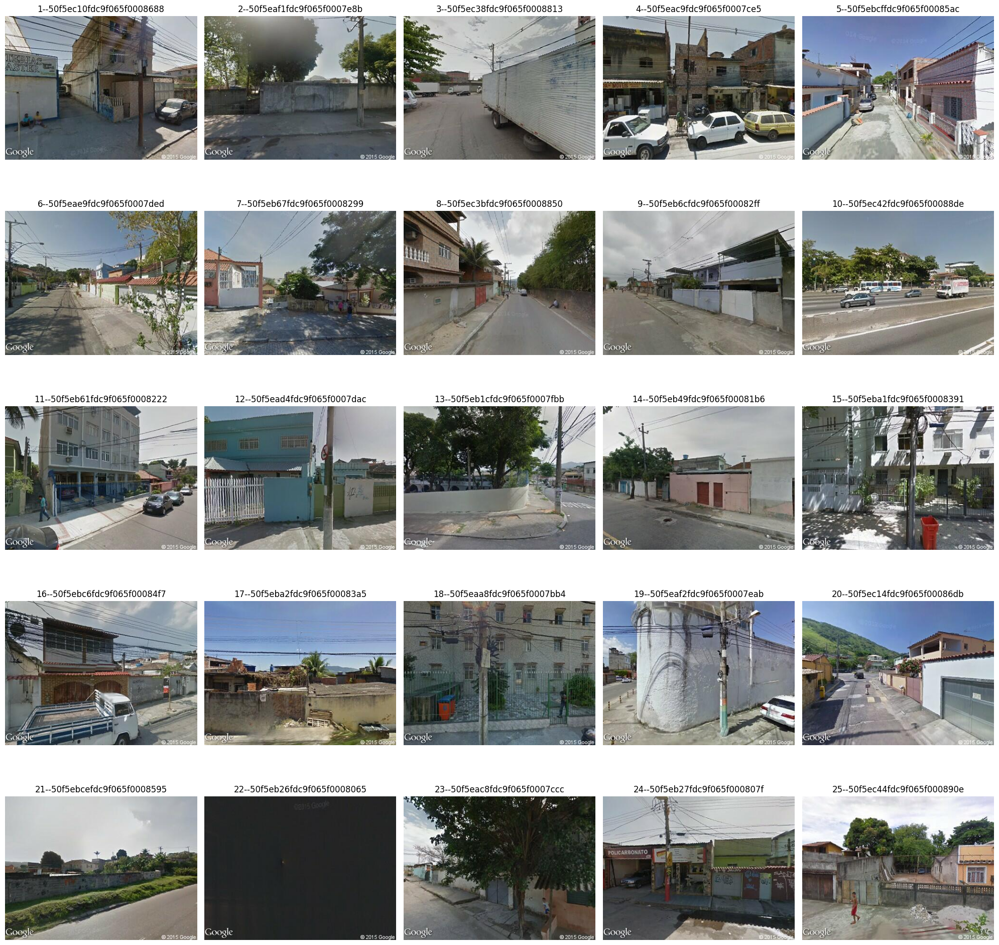

In [13]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Number of images
num_images = len(bot_k_images_path)

# Create a figure with a 4x4 grid (adjust figsize as needed)
fig, axes = plt.subplots(5, 5, figsize=(20, 20))

# Flatten the axes for easy iteration
axes = axes.ravel()

# Iterate over the images and plot them
for i in range(num_images):
    title = bot_k_images_path[i].split("/")[-1].replace(".JPG", "")
    score = data_df[data_df["image_id"]==title][cfg.PERCEPTION_METRIC].values[0]
    print(i+1, title, score)
    img = mpimg.imread(bot_k_images_path[i])  # Load the image
    axes[i].imshow(img)  # Show the image
    axes[i].set_title(f"{i+1}--{title}")
    axes[i].axis('off')  # Turn off the axis

# Adjust layout and display the grid of images
plt.tight_layout()
plt.show()